# Розширення межі вимірювання амперметра

Формула для розрахунку різниці потенціалів для зашунтованного амперметру

$U_{AB} = J_{a} R_{a} = J_{shunt} R_{shunt} = J \frac{R_a R_{shunt}}{R_a + R_{shunt}}$

звідки

$J = J_a \frac{R_a + R_{shunt}}{R_{shunt}} = J_a \left( \frac{R_a}{R_{shunt}} + 1 \right) = J_a P$

величина $P = J / J_a$ яка показує, в скілки разів збільшується межа вимірювання струмового приладу, називається шунтуючим множником. Очевидно

$P = \left( \frac{R_a}{R_{shunt}} + 1 \right)$

$R_{shunt} = \frac{R_a}{P-1}$

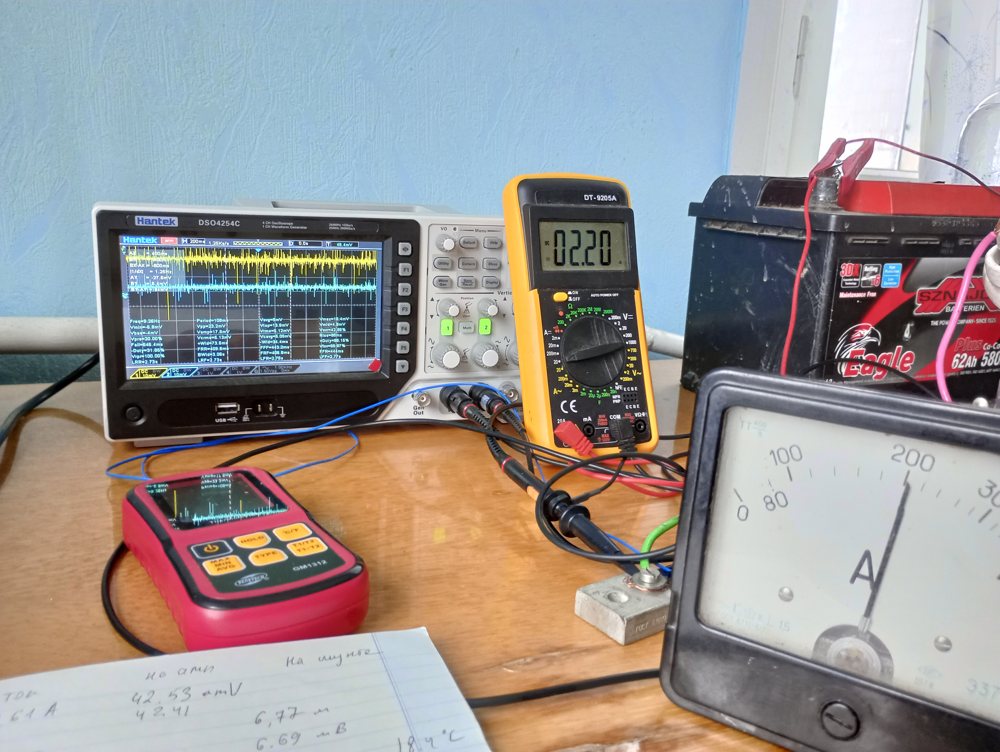

In [1]:
A_mV_Shunt = [
    [0,0],
    [0.22, 0.405],
    [0.22, 0.431],
    [0.22, 0.456],
    [3.55, 6.77],
    [3.53, 6.69],
    [3.51, 6.69],
    [2.13, 4.35],
    [2.12, 4.34],
    [2.13, 4.37],
    [2.10, 4.35],
    [2.19, 4.94],
    [2.18, 4.94],
]

A_mV_Ampermeter = [
    [0,0],
    [0.25, 3.25],
    [0.25, 3.16],
    [0.2,  2.48],
    [0.18, 2.29],
    [3.61, 42.53],
    [3.61, 42.41],
    [3.48, 42.75],
    [3.47, 42.7],
    [3.46, 42.68],
    [2.18, 26.47], # (2 A)
    [2.17, 26.38], # (2 A)
    [2.16, 25.47], # (2 A)
    [2.18, 26.88], # (2 A)
]

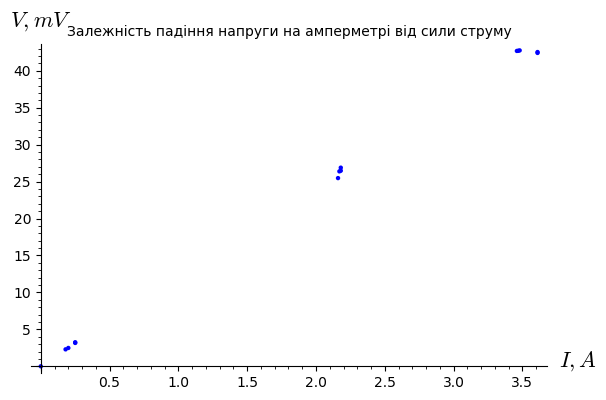

In [57]:
plt_Ampermeter = list_plot(A_mV_Ampermeter)
plt_Ampermeter.show(axes_labels=['$I, A$','$V, mV$'], title="Залежність падіння напруги на амперметрі від сили струму")

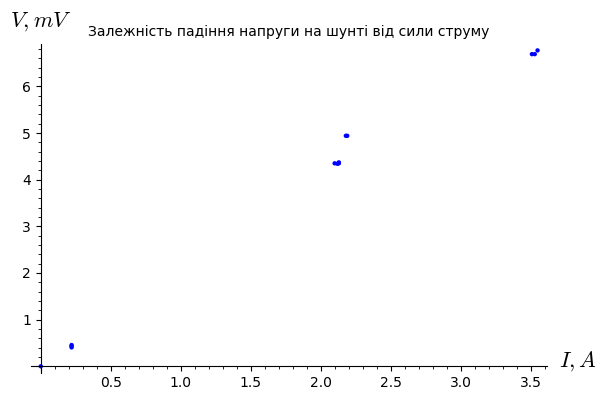

In [58]:
plt_Shunt = list_plot(A_mV_Shunt)
plt_Shunt.show(axes_labels=['$I, A$','$V, mV$'], title="Залежність падіння напруги на шунті від сили струму")

In [44]:
# Linear approximation
def linear_approximation(A_mV):
    import common as cm
    # build error function
    r, v = var("r, v")
    errors = 0
    for (A, mV) in A_mV:
        errors += (r*A + v - mV)^2
    errors = errors.expand()
    cm.displ("Error =" + latex(errors))
    # Derivatives of error function
    cm.displ("\\frac{\\partial Error}{\\partial r} =" + latex(diff(errors, r)))
    cm.displ("\\frac{\\partial Error}{\\partial v} =" + latex(diff(errors, v)))
    # set derivatives of error function equial to zero
    equations = [diff(errors, r) == 0, diff(errors, v) == 0]
    cm.disp(equations)
    # solve obtained equations, and find a, b
    solution_rv = solve(equations, [r,v])[0]
    cm.disp(solution_rv)
    R = solution_rv[0].rhs().n()
    V = solution_rv[1].rhs().n()
    cm.displ("R = " + '{:6.3f}'.format(R) + "\\,m\\Omega")
    cm.displ("V = " + '{:6.3f}'.format(V) + "\\,mV")

    # Стандартне відхилення
    nevjazka = errors.subs([r == R, v == V])
    print("nevjazka =", nevjazka)
    vidhilennja = sqrt(nevjazka/(len(A_mV) - 1))
    print("vidhilennja =", vidhilennja)
    return R, V

In [45]:
R_Ampermeter_mOhm, B_Ampermeter = linear_approximation(A_mV_Ampermeter)

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

nevjazka = 5.22802455418730
vidhilennja = 0.634157500103472


In [46]:
R_Shunt_mOhm, B_Shunt = linear_approximation(A_mV_Shunt)

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

nevjazka = 0.968338486400329
vidhilennja = 0.284068431661623


In [47]:
iA = var("iA")
R_Ampermeter_approximation = R_Ampermeter_mOhm * iA + B_Ampermeter
R_Shunt_approximation      = R_Shunt_mOhm      * iA + B_Shunt

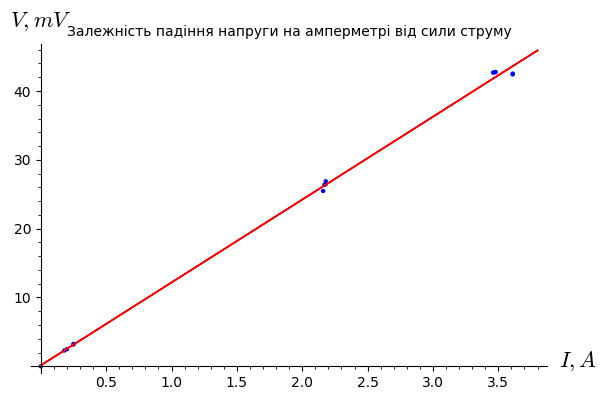

In [50]:
plt_Ampermeter += plot(R_Ampermeter_approximation, iA, 0, 3.8, color = "red")
plt_Ampermeter.show(axes_labels=['$I, A$','$V, mV$'], title="Залежність падіння напруги на амперметрі від сили струму")

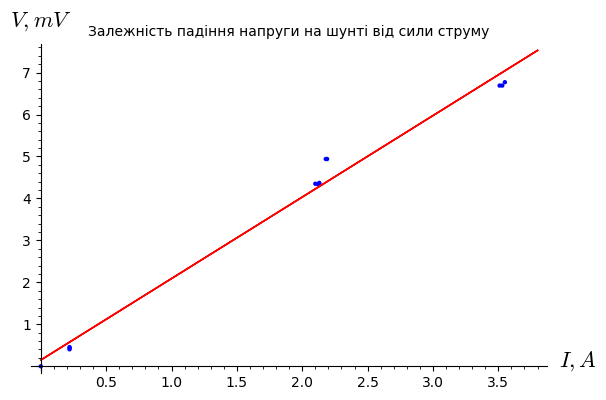

In [51]:
plt_Shunt += plot(R_Shunt_approximation, iA, 0, 3.8, color = "red")
plt_Shunt.show(axes_labels=['$I, A$','$V, mV$'], title="Залежність падіння напруги на шунті від сили струму")

Шунтуючий множник $P = \frac{J}{J_a} = \left( \frac{R_a}{R_{shunt}} + 1 \right)$ для цього шунта становитиме

In [53]:
P = R_Ampermeter_mOhm / R_Shunt_mOhm + 1
P

7.20184414345861

In [54]:
4 * P

28.8073765738345

Таким чином застосування наявного шунта разширює межу вимірювання амперметру від 4 ампер до 28.8 Ампер